In [ ]:
!pip install librosa

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping



# Loading .wav data

Step 1: Loading the train and test data using librose library.

Step 2: Calculate Short time Fourier Transform of the train and test data and the size of the stft is (513 × 2459)

In [ ]:
s, sr=librosa.load("/content/train_clean_male.wav", sr=None)
S=librosa.stft(s, n_fft=1024, hop_length=512)
sn, snr=librosa.load("/content/train_dirty_male.wav", sr=None)
X=librosa.stft(sn, n_fft=1024, hop_length=512)

In [ ]:
print(S.shape)
print(X.shape)

(513, 2459)
(513, 2459)


# Clean Audio

In [ ]:
print('Clean Audio')
Audio(s,rate= sr)

Clean Audio


# Noisy Audio

In [ ]:
print("Noisy Audio")
Audio(sn,rate= snr)

Noisy Audio


# Visualization of waveform and spectrum

Step 3: Find magnitudes |S| and |X|

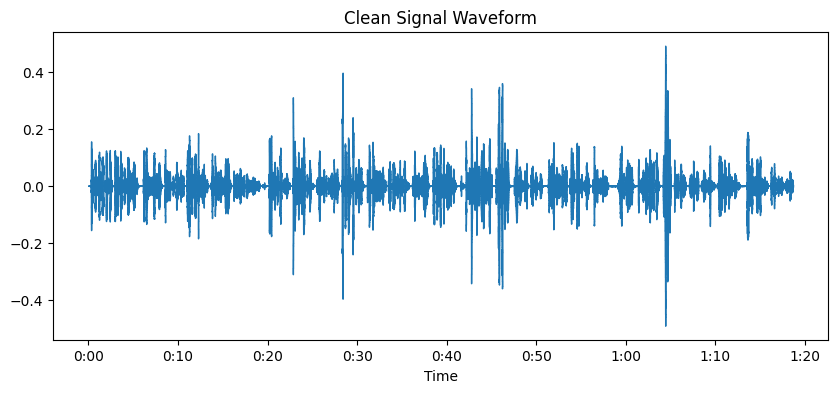

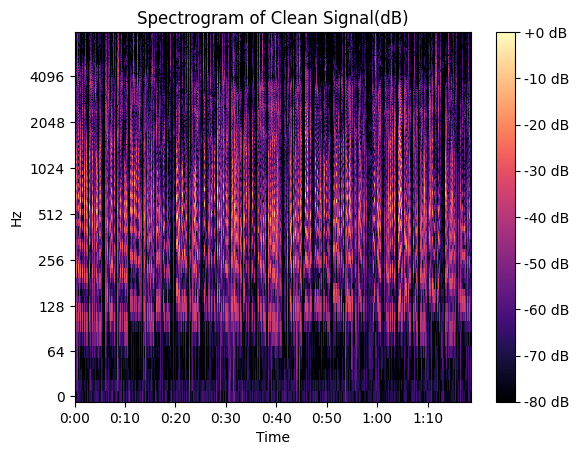

In [ ]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(s, sr=sr)
plt.title("Clean Signal Waveform")
plt.show()

S_mag = np.abs(S)
librosa.display.specshow(librosa.amplitude_to_db(S_mag, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Clean Signal(dB)')
plt.show()



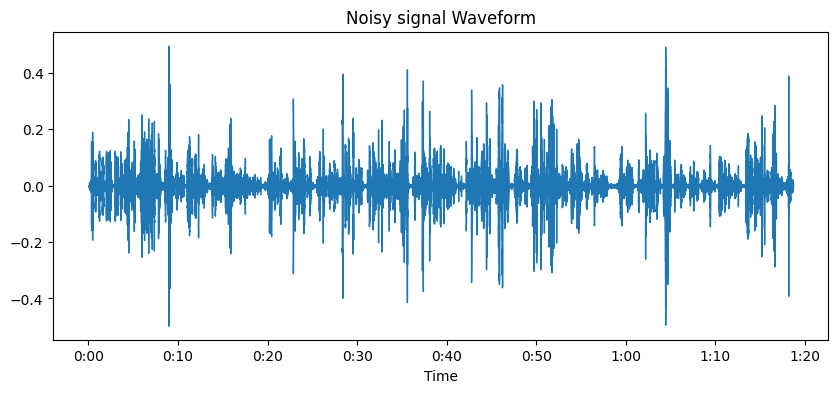

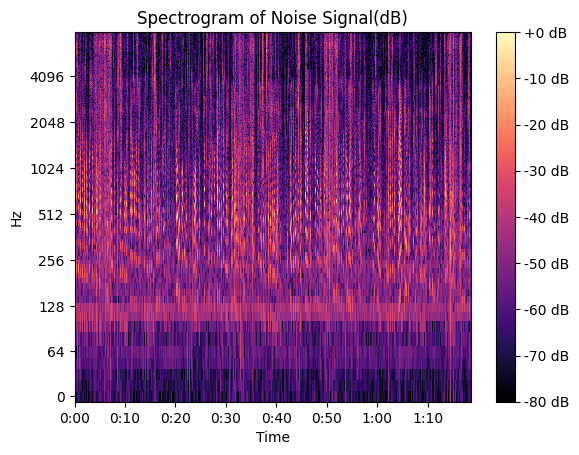

In [ ]:
plt.figure(figsize=(10, 4))
librosa.display.waveshow(sn, sr=sr)
plt.title("Noisy signal Waveform")
plt.show()

X_mag = np.abs(X)
librosa.display.specshow(librosa.amplitude_to_db(X_mag, ref=np.max), sr=sr, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram of Noise Signal(dB)')
plt.show()

 # Training of model

 Step 3: Train a fully-connected deep neural network.

 The input to the network is a column vector of |X| (a 513-dim vector) and the target is its
 corresponding one in |S|.

In [ ]:

input_dim = 513

model = models.Sequential([layers.Input(shape=(input_dim,)),

    layers.Dense(1024, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(512, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(256, activation='relu', kernel_initializer='he_normal'),
    layers.Dense(input_dim, activation='softplus')])
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),loss='mse',
metrics=['mae'])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_12 (Dense)                │ (None, 1024)           │       526,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 513)            │       131,841 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,314,305 (5.01 MB)

 Trainable params: 1,314,305 (5.01 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

X_train = X_mag.T
S_train = S_mag.T

early_stop = EarlyStopping(monitor='val_loss', patience=50, restore_best_weights=True,verbose=1)

history = model.fit(X_train, S_train, validation_split=0.2,batch_size=64,epochs=500,callbacks=[early_stop],verbose=1)

Epoch 1/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 29ms/step - loss: 0.0390 - mae: 0.0651 - val_loss: 0.0414 - val_mae: 0.0630
Epoch 2/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0351 - mae: 0.0629 - val_loss: 0.0409 - val_mae: 0.0621
Epoch 3/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0344 - mae: 0.0608 - val_loss: 0.0405 - val_mae: 0.0613
Epoch 4/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 34ms/step - loss: 0.0336 - mae: 0.0619 - val_loss: 0.0402 - val_mae: 0.0601
Epoch 5/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 42ms/step - loss: 0.0362 - mae: 0.0611 - val_loss: 0.0398 - val_mae: 0.0592
Epoch 6/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0330 - mae: 0.0595 - val_loss: 0.0395 - val_mae: 0.0586
Epoch 7/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0347 - mae: 0.0587 - val_loss: 0.0393 - val_mae: 0.0579
Epoch 8/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - loss: 0.0346 - mae: 0.0578 - val_loss: 0.0392 - val_mae: 0.0573
Epoch 9/500
31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 27ms/step - lo

In [ ]:
S_pred = model.predict(X_train)
S_pred = S_pred.T

77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


# Converting spectrum back to audio

# Denoised audio

In [ ]:
phase = np.angle(X)
# Reconstruct STFT
S_pred_stft = S_pred * np.exp(1j * phase)
# Inverse STFT
y_denoised = librosa.istft(S_pred_stft, hop_length=512)
# Listen to denoised audio
Audio(y_denoised, rate=sr)


# Signal to Noise Ratio Calculation

In [ ]:
def compute_snr(clean, denoised):
    min_len = min(len(clean), len(denoised))
    clean_trimmed = clean[:min_len]
    denoised_trimmed = denoised[:min_len]

    snr = 10 * np.log10(np.sum(clean_trimmed**2) / np.sum((clean_trimmed - denoised_trimmed)**2))
    return snr

snr = compute_snr(sn, y_denoised)
print("SNR (dB):", snr)

SNR (dB): 7.674847


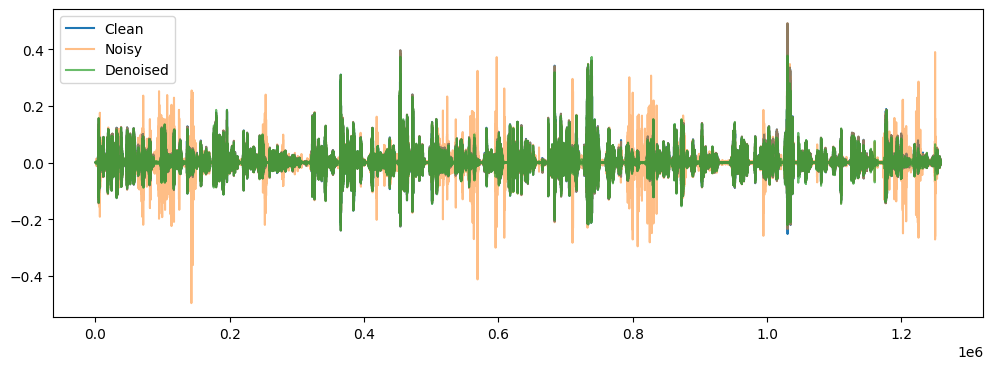

In [ ]:
plt.figure(figsize=(12,4))
plt.plot(s, label='Clean')
plt.plot(sn, alpha=0.5, label='Noisy')
plt.plot(y_denoised, alpha=0.7, label='Denoised')
plt.legend()
plt.show()

# Test audio case _ 1

In [ ]:
test_file = "/content/test_x_01.wav"
y_test, sr = librosa.load(test_file, sr=None)
print(f"Test audio shape: {y_test.shape}, sample rate: {sr}")

n_fft = 1024
hop_length = 512

X_test = librosa.stft(y_test, n_fft=n_fft, hop_length=hop_length)
X_mag_test = np.abs(X_test)
X_phase_test = np.angle(X_test)

X_test_input = X_mag_test.T
print("Network input shape:", X_test_input.shape)

S_pred_test = model.predict(X_test_input)
S_pred_test = S_pred_test.T
print("Predicted magnitude shape:", S_pred_test.shape)

X_test_normalized = X_test / (X_mag_test + 1e-8)
S_hat_complex = X_test_normalized * S_pred_test

y_denoised_test = librosa.istft(S_hat_complex, hop_length=hop_length)

# Listen to denoised audio
Audio(y_denoised_test, rate=sr)



Test audio shape: (72619,), sample rate: 16000
Network input shape: (142, 513)
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
Predicted magnitude shape: (513, 142)


# Noisy audio of Test case _ 1

In [ ]:
Audio(y_test, rate=sr)

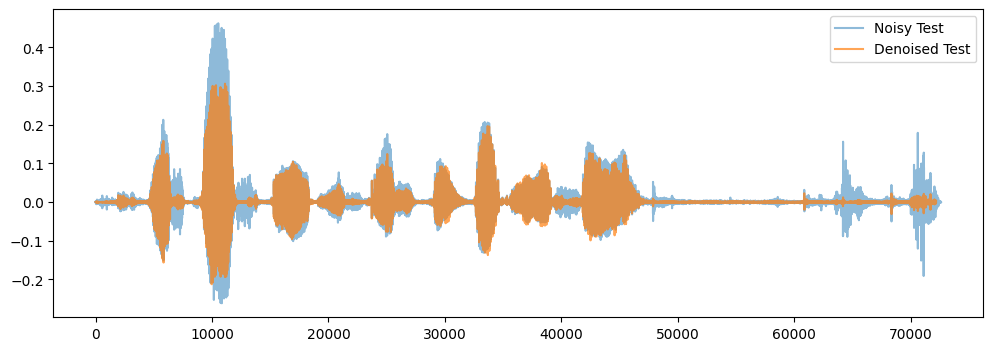

In [ ]:

plt.figure(figsize=(12,4))
plt.plot(y_test, alpha=0.5, label='Noisy Test')
plt.plot(y_denoised_test, alpha=0.7, label='Denoised Test')
plt.legend()
plt.show()

In [ ]:
snr = compute_snr(y_test, y_denoised_test)
print("SNR (dB):", snr)

SNR (dB): 7.866377


# Test audio case _ 2

In [ ]:
test_file = "/content/test_x_02.wav"  # noisy test audio
y_test, sr = librosa.load(test_file, sr=None)
print(f"Test audio shape: {y_test.shape}, sample rate: {sr}")

n_fft = 1024
hop_length = 512

X_test = librosa.stft(y_test, n_fft=n_fft, hop_length=hop_length)
X_mag_test = np.abs(X_test)  # |Xtest|
X_phase_test = np.angle(X_test)  # store phase for reconstruction

X_test_input = X_mag_test.T
print("Network input shape:", X_test_input.shape)

S_pred_test = model.predict(X_test_input)  # shape: (num_frames, 513)
S_pred_test = S_pred_test.T  # (513, num_frames) to match STFT layout
print("Predicted magnitude shape:", S_pred_test.shape)

X_test_normalized = X_test / (X_mag_test + 1e-8)  # avoid division by zero
S_hat_complex = X_test_normalized * S_pred_test

y_denoised_test = librosa.istft(S_hat_complex, hop_length=hop_length)

# Listen to denoised audio
Audio(y_denoised_test, rate=sr)


Test audio shape: (194353,), sample rate: 16000
Network input shape: (380, 513)
12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Predicted magnitude shape: (513, 380)


Noisy Audio of Test case _ 2

In [ ]:
Audio(y_test, rate=sr)

In [ ]:
snr = compute_snr(y_test, y_denoised_test)
print("SNR (dB):", snr)

SNR (dB): 7.418585


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from google.colab import files

!jupyter nbconvert --to html "/content/drive/MyDrive/Colab Notebooks/DLS_HW2_1.ipynb"
files.download("/content/drive/MyDrive/Colab Notebooks/DLS_HW2_1.html")

Mounted at /content/drive
[NbConvertApp] Converting notebook /content/drive/MyDrive/Colab Notebooks/DLS_HW2_1.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 6 image(s).
[NbConvertApp] Writing 2716579 bytes to /content/drive/MyDrive/Colab Notebooks/DLS_HW2_1.html


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>